In [1]:
from pathlib import Path
from scipy.stats import zscore
from typing import Dict, Any

from matplotlib import pyplot as plt
import nibabel as nib

from nsbutils.plotting import plot_surf

from neuromodes.eigen import EigenSolver
from neuromodes.io import fetch_example_surf
from neuromodes.stats import sigmoid_rescale, zscorew

from demo_waves import calc_fc, evaluate_model


DEMO_DIR = Path.cwd().parent

In [2]:
# Define constants
subj_id = "103818"
visit = "retest"
alpha = 3.0
r = 78
gamma = 0.116
n_modes = 100
n_runs = 4
noise_seed = 0

# Empirical constants
nt_emp = 1200
dt_emp = 0.72
dt_model = 0.09
tsteady = 550

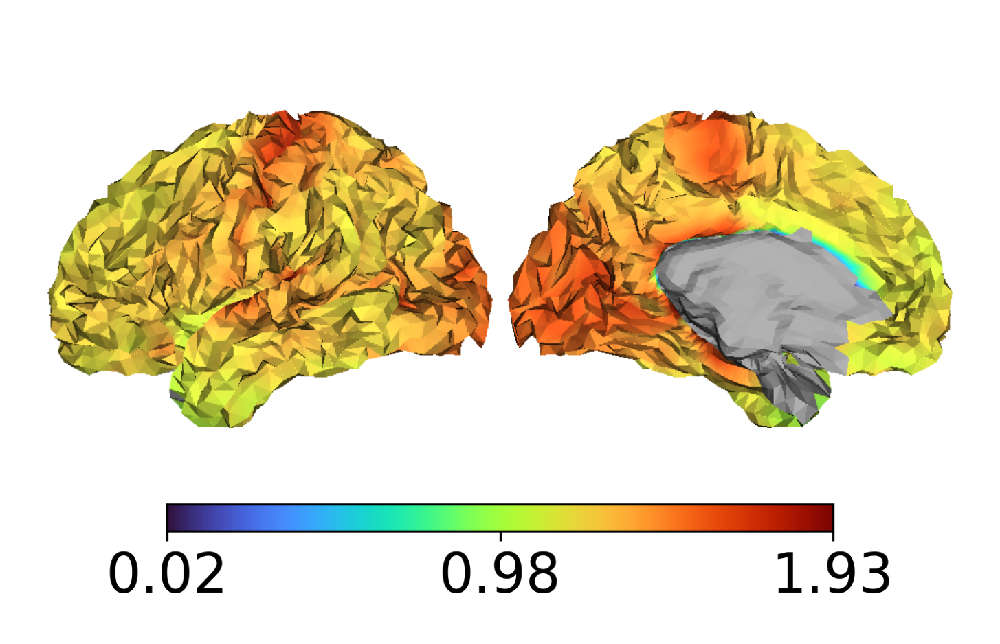

In [3]:
surf = str(
    DEMO_DIR
    / "data"
    / subj_id
    / visit
    / f"{subj_id}.L.midthickness_MSMAll.4k_fs_LR.surf.gii"
)
_, medmask = fetch_example_surf(density="4k")
hetero_map = nib.load(
    str(
        DEMO_DIR
        / "data"
        / subj_id
        / visit
        / f"{subj_id}.L.MyelinMap_BC_MSMAll.4k_fs_LR.func.gii"
    )
).darrays[0].data

hetero_map[~medmask] = np.nan
hetero_fig, ax = plt.subplots(1, 1, figsize=(6, 4))
plot_surf(surf, hetero_map, cmap="turbo", ax=ax, cbar=True)
plt.show()

In [4]:
# Initialise solver
solver = EigenSolver(surf, medmask)
print(solver)

EigenSolver
-----------
Surface mesh: 3619 vertices (383 others masked out), 7144 triangles


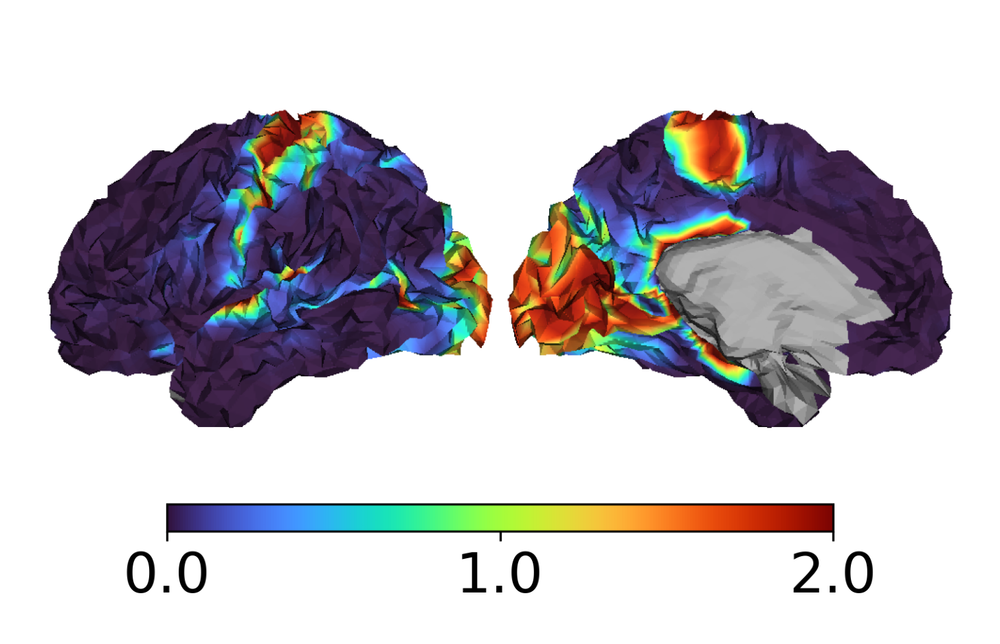

In [5]:
# Scale hetero map
hetero_scaled = sigmoid_rescale(
    zscorew(hetero_map[medmask], mass=solver.mass),
    lower=0.0,
    upper=2.0,
    center=1.0,
    steepness=float(alpha),
)

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
plot_surf(surf, solver.unmask_data(hetero_scaled), cmap="turbo", ax=ax, cbar=True)
plt.show()

In [6]:
# Simulate bold activity
solver.solve(hetero=hetero_scaled, n_modes=int(n_modes), seed=365)
downsample_factor = int(dt_emp / dt_model)
nt_model = int(nt_emp * downsample_factor) + int(tsteady)
bold = np.empty((int(np.sum(medmask)), nt_emp, n_runs), dtype=np.float32)
for i in range(n_runs):
    sim_kwargs: Dict[str, Any] = {
        "dt": dt_model,
        "nt": nt_model,
        "seed": int(noise_seed) + i,
        "cache_input": True,
        "method": "fourier",
    }
    if r is not None:
        sim_kwargs["r"] = float(r)
    if gamma is not None:
        sim_kwargs["gamma"] = float(gamma)
    bold_i = solver.balloon_model(solver.sim_nft_waves(**sim_kwargs), dt=dt_model).astype(np.float32)
    bold_i = bold_i[:, tsteady:][:, ::downsample_factor]
    bold[:, :, i] = zscore(bold_i, axis=1).astype(np.float32)

model_fc = calc_fc(np.hstack([bold[:, :, i] for i in range(n_runs)]))

Using cache directory at /Users/victorbarnes/.neuromodes_cache. To cache elsewhere, set cache_dir.
Using cache directory at /Users/victorbarnes/.neuromodes_cache. To cache elsewhere, set cache_dir.
Using cache directory at /Users/victorbarnes/.neuromodes_cache. To cache elsewhere, set cache_dir.
Using cache directory at /Users/victorbarnes/.neuromodes_cache. To cache elsewhere, set cache_dir.


In [7]:
# Load and compute empirical FC
bold_data = []
for session in ("1", "2"):
    for acquisition in ("LR", "RL"):
        bold_path = (
            DEMO_DIR
            / "data"
            / subj_id
            / visit
            / f"rfMRI_REST{session}_{acquisition}_Atlas_MSMAll_hp2000_clean_rclean_tclean_4k.L.func.gii"
        )
        bold = np.asarray(nib.load(str(bold_path)).agg_data(), dtype=np.float32)[:, medmask].T
        bold_data.append(zscore(bold, axis=1).astype(np.float32))
        if np.isnan(bold_data).any():
            raise ValueError(f"NaN values found in empirical BOLD data: {bold_path}")
emp_fc = calc_fc(np.concatenate(bold_data, axis=1).astype(np.float32))

In [8]:
metrics = evaluate_model({"fc": model_fc}, {"fc": emp_fc}, metrics=["edge_fc_corr", "node_fc_corr"])

print(f"Edge FC correlation: {metrics['edge_fc_corr']:.4f}")
print(f"Node FC correlation: {metrics['node_fc_corr']:.4f}")

Edge FC correlation: 0.4189
Node FC correlation: 0.6698


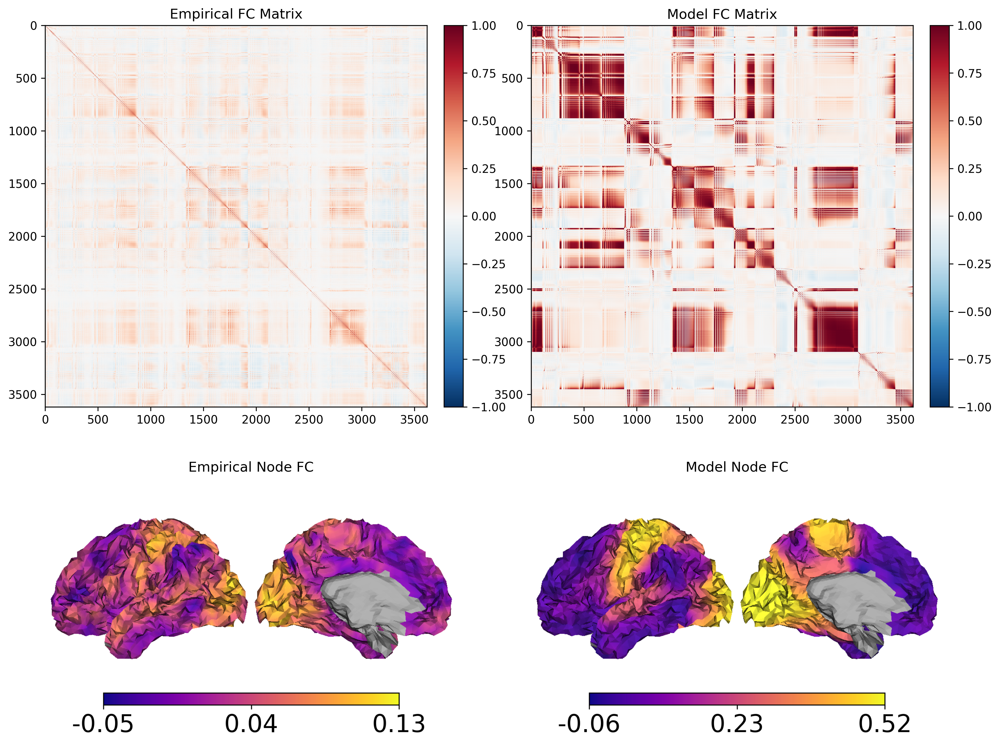

In [9]:
# Plot empirical FC matrices and node FC surfaces
from demo_waves import calc_node_fc

fig, axs = plt.subplots(2, 2, figsize=(12, 10))
im0 = axs[0, 0].imshow(emp_fc, cmap="RdBu_r", vmin=-1, vmax=1)
axs[0, 0].set_title("Empirical FC Matrix")
plt.colorbar(im0, ax=axs[0, 0], fraction=0.046, pad=0.04)
im1 = axs[0, 1].imshow(model_fc, cmap="RdBu_r", vmin=-1, vmax=1)
axs[0, 1].set_title("Model FC Matrix")
plt.colorbar(im1, ax=axs[0, 1], fraction=0.046, pad=0.04)

plot_surf(surf, solver.unmask_data(calc_node_fc(emp_fc)), cmap="plasma", ax=axs[1, 0], cbar=True)
axs[1, 0].set_title("Empirical Node FC")
plot_surf(surf, solver.unmask_data(calc_node_fc(model_fc)), cmap="plasma", ax=axs[1, 1], cbar=True)
axs[1, 1].set_title("Model Node FC")
plt.tight_layout()
plt.show()